#**Air Pollution**


# Setup

In [ ]:
credentials = {
  "bucket": "airpollutiontest",
  "access_key_id": "003ab6bac7ee427e88e500140c27cda8",
  "secret_access_key": "3ec5ea2c14ecda441278551ab709c093c985a1fe2cb595d6",
  "endpoint_url": "https://s3.us.cloud-object-storage.appdomain.cloud"
}

## Install Prerequisites

We use Keras/Tensorflow to build the classification model, and visualize the process with matplotlib.

In [ ]:
!pip install tensorflow==1.15 ibm-cos-sdk==2.6

In [ ]:
# Import required libraries
import os
import uuid
import shutil
import json
from botocore.client import Config
import ibm_boto3
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

## Read The Data

Here we build simple wrapper functions to read in the data from our cloud object storage buckets and extract it.

A download function from IBM Cloud

In [ ]:
def download_file_cos(credentials, local_file_name, key): 
    '''
    Wrapper function to download a file from cloud object storage using the
    credential dict provided and loading it into memory
    '''
    cos = ibm_boto3.client(
        service_name='s3',
        aws_access_key_id=credentials['access_key_id'],
        aws_secret_access_key=credentials['secret_access_key'],
        endpoint_url=credentials['endpoint_url'])
    try:
        res=cos.download_file(Bucket=credentials['bucket'], Key=key, Filename=local_file_name)
    except Exception as e:
        print(Exception, e)
    else:
        print('File Downloaded')

def get_annotations(credentials): 
    cos = ibm_boto3.client(
        service_name='s3',
        aws_access_key_id=credentials['access_key_id'],
        aws_secret_access_key=credentials['secret_access_key'],
        endpoint_url=credentials['endpoint_url'])
    try:
        return json.loads(cos.get_object(Bucket=credentials['bucket'], Key='_annotations.json')['Body'].read())
    except Exception as e:
        print(Exception, e)

In [ ]:
base_path = 'data'
if os.path.exists(base_path) and os.path.isdir(base_path):
    shutil.rmtree(base_path)
os.makedirs(base_path, exist_ok=True)

annotations = get_annotations(credentials)

for i, image in enumerate(annotations['annotations'].keys()):
    label = annotations['annotations'][image][0]['label']
    os.makedirs(os.path.join(base_path, label), exist_ok=True)
    _, extension = os.path.splitext(image)
    local_path = os.path.join(base_path, label, str(uuid.uuid4()) + extension)
    download_file_cos(credentials, local_path, image)

File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded
File Downloaded


In [ ]:
!ls data/Clean\ air
!ls data/Polluted\ air

09b89cda-f87d-473e-86a3-474e1a8d89f6.jpg
0d9cacad-79b7-4a26-a987-36916aa29ac1.PNG
135ca924-9296-43bc-be10-4d9aaee7560c.jpg
1be83e82-4a4a-4b7e-aea4-51c0cd58cbca.jpg
1de202cc-41a9-42c1-aa36-41fc90bb0ea4.jpg
28928308-736d-45f2-8931-6206d5340642.jpg
2a3f9737-ed1f-445c-a0f6-76762fe3c28b.jpg
2d71d81f-e8da-426f-a13d-55accd2290b8.jpg
36016019-32b6-4270-a235-d47b11821557.jpg
3622123b-7e20-400e-88cb-76aec99cfad9.jpg
4286a13c-92aa-4f58-910f-8e320b81253e.jpg
45cce6bf-cc95-4876-b770-f4e4436f7e98.jpg
5a8b3678-512c-4b16-b4ae-3d3621fc2bfa.jpg
63277c93-e817-45cb-9cfa-2f6360c230d9.PNG
7d8f3bc8-5e4b-442d-a260-0c25043e64db.jpg
7e3c2ded-f03f-40b7-9551-960aefefb8e7.jpg
80639caf-e70c-4471-b51f-265a7932d202.PNG
8be34cf5-74cb-459a-88b2-00594bb72c9b.PNG
9deaad87-31ee-4dae-967b-d0b9b0a7ed30.jpg
a835acfd-dd07-4615-bc3c-46870613395e.jpg
c71b375f-2509-4e85-ac70-9b7530ca59c3.PNG
e27b4ea9-1c2b-43e4-89de-5691d0fcc069.jpg
ee658339-91e5-47e5-a87d-49478ed023b2.jpg
ff259106-2deb-454f-81de-9885c1b9aad1.PNG
00102faf-3199-45

## Build the Model

We start with a [MobileNetV2](https://arxiv.org/abs/1801.04381) architecture as the backbone [pretrained feature extractor](https://github.com/tensorflow/models/tree/master/research/slim/nets/mobilenet). We then add a couple of dense layers and a softmax layer to perfom the classification. We freeze the MobileNetV2 backbone with weights trained on ImageNet dataset and only train the dense layers and softmax layer that we have added.

In [ ]:
base_model=tf.keras.applications.MobileNetV2(weights='imagenet',include_top=False) #imports the mobilenet model and discards the last 1000 neuron layer.
x=base_model.output
x=tf.keras.layers.GlobalAveragePooling2D()(x)
x=tf.keras.layers.Dense(512,activation='relu')(x) #dense layer 1
x=tf.keras.layers.Dense(256,activation='relu')(x) #dense layer 2
preds=tf.keras.layers.Dense(2,activation='softmax')(x) #final layer with softmax activation

model=tf.keras.Model(inputs=base_model.input,outputs=preds)


/usr/local/lib/python3.7/dist-packages/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


In [ ]:
#Freeze layers from MobileNetV2 backbone (not to be trained)
for layer in base_model.layers:
    layer.trainable=False

In [ ]:
#Prepare the training dataset as a data generator object
train_datagen=tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input) #included in our dependencies

train_generator=train_datagen.flow_from_directory('data',
                                                 target_size=(224,224),
                                                 color_mode='rgb',
                                                 batch_size=10,
                                                 class_mode='categorical',
                                                 shuffle=True)

Found 60 images belonging to 2 classes.


### Using Adam, categorical_crossentropy and accuracy as optimization method, loss function and metrics, respectively

In [ ]:
# Build the model
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_3[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, None, None, 3 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, None, None, 3 128         Conv1[0][0]                      
____________________________________________________________________________________________

## Train the model

In [ ]:
from tensorflow import set_random_seed
set_random_seed(2)
step_size_train=10
log_file = model.fit_generator(generator=train_generator,
                   steps_per_epoch=step_size_train,
                   epochs=10)

Epoch 1/10
10/10 [==============================] - 23s 2s/step - loss: 0.1058 - acc: 0.9700
Epoch 2/10
10/10 [==============================] - 20s 2s/step - loss: 0.0369 - acc: 1.0000
Epoch 3/10
10/10 [==============================] - 23s 2s/step - loss: 0.0975 - acc: 0.9700
Epoch 4/10
10/10 [==============================] - 22s 2s/step - loss: 0.4209 - acc: 0.8300
Epoch 5/10
10/10 [==============================] - 22s 2s/step - loss: 0.1009 - acc: 0.9600
Epoch 6/10
10/10 [==============================] - 22s 2s/step - loss: 0.0843 - acc: 0.9600
Epoch 7/10
10/10 [==============================] - 23s 2s/step - loss: 0.1806 - acc: 0.9400
Epoch 8/10
10/10 [==============================] - 22s 2s/step - loss: 0.0297 - acc: 1.0000
Epoch 9/10
10/10 [==============================] - 21s 2s/step - loss: 0.0345 - acc: 0.9900
Epoch 10/10
10/10 [==============================] - 23s 2s/step - loss: 0.0424 - acc: 1.0000


## Figure of Training Loss and Accuracy

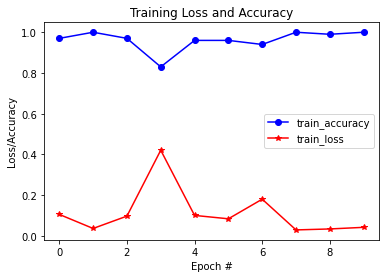

In [ ]:
# Model accuracy and loss vs epoch
plt.plot(log_file.history['acc'], '-bo', label="train_accuracy")
plt.plot(log_file.history['loss'], '-r*', label="train_loss")
plt.title('Training Loss and Accuracy')
plt.ylabel('Loss/Accuracy')
plt.xlabel('Epoch #')
plt.legend(loc='center right')
plt.show()

## Model Performance

Here we perform inference on some sample data points to determine the performance of the model

In [ ]:
# Mapping labels 
label_map = (train_generator.class_indices)

In [ ]:
label_map

{'Clean air': 0, 'Polluted air': 1}

In [ ]:
# Creating a sample inference function
def prediction(image_path, model):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    x = tf.keras.preprocessing.image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = tf.keras.applications.mobilenet_v2.preprocess_input(x)
    preds = model.predict(x)
    #print('Predictions', preds)
    
    for pred, value in label_map.items():    
        if value == np.argmax(preds):
            print('Predicted class is:', pred)
            print('With a confidence score of: ', np.max(preds))
    
    return np.argmax(preds)

In [ ]:
pic1 = 'https://www.pv-magazine.com/wp-content/uploads/2018/09/power-station-374097_1920-1200x799.jpg'
mug_url = 'https://www.irishtimes.com/polopoly_fs/1.3273228.1509295255!/image/image.jpg_gen/derivatives/ratio_1x1_w1200/image.jpg'
donut_url = 'https://i.pinimg.com/originals/d2/c7/91/d2c791aa7fa888a20394edb492e7aff7.jpg'
test_url = 'https://www.nwf.org/-/media/NEW-WEBSITE/Design/Carousel-Images/Smoking-pipes-thermal-power-plant_495x275.ashx'
camp_url = 'https://diaonline.ig.com.br/wp-content/uploads/2019/05/acampamento-no-interior-de-goias-conheca-destinos-incriveis-1024x665.jpeg'
mm = 'https://somnomed.com/wp-content/uploads/2017/09/night-sky.jpg'
!wget {pic1} -O loula.jpg 
!wget {mug_url} -O Mug.jpg
!wget {donut_url} -O Donut.jpg
!wget {test_url} -O testtest.jpg
!wget {camp_url} -O camping.jpg
!wget {mm} -O night.jpg

--2021-05-15 23:08:34--  https://www.pv-magazine.com/wp-content/uploads/2018/09/power-station-374097_1920-1200x799.jpg
Resolving www.pv-magazine.com (www.pv-magazine.com)... 35.187.64.88
Connecting to www.pv-magazine.com (www.pv-magazine.com)|35.187.64.88|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 89481 (87K) [image/jpeg]
Saving to: ‘loula.jpg’

loula.jpg           100%[===================>]  87.38K   450KB/s    in 0.2s    

2021-05-15 23:08:35 (450 KB/s) - ‘loula.jpg’ saved [89481/89481]

--2021-05-15 23:08:35--  https://www.irishtimes.com/polopoly_fs/1.3273228.1509295255!/image/image.jpg_gen/derivatives/ratio_1x1_w1200/image.jpg
Resolving www.irishtimes.com (www.irishtimes.com)... 151.101.2.174, 151.101.66.174, 151.101.130.174, ...
Connecting to www.irishtimes.com (www.irishtimes.com)|151.101.2.174|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 107943 (105K) [image/jpeg]
Saving to: ‘Mug.jpg’

Mug.jpg             100%[=========

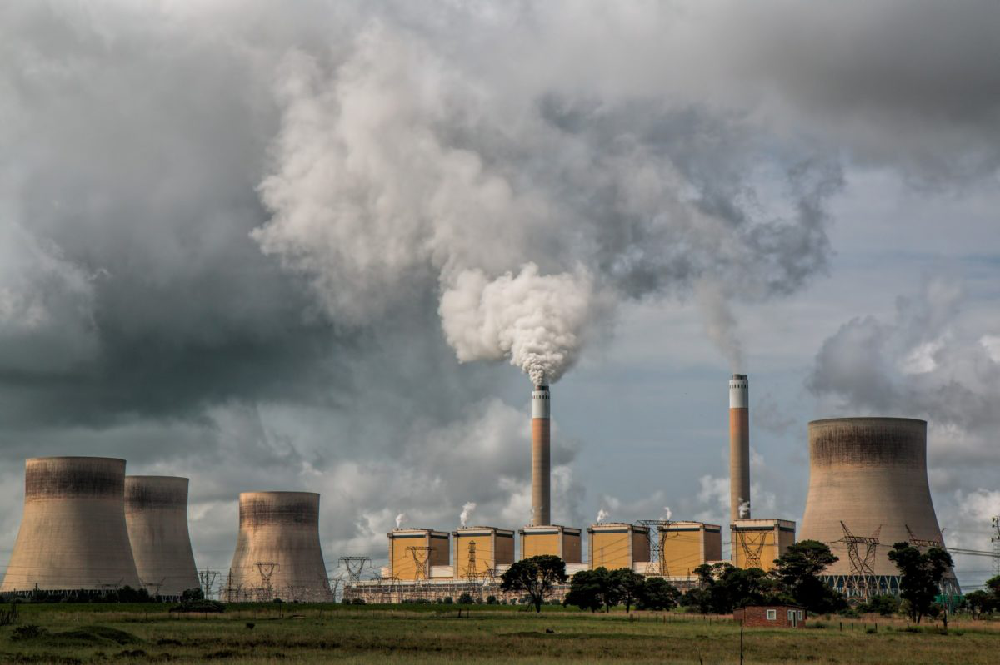

In [ ]:
#Opening first image
image = Image.open("loula.jpg")
image

In [ ]:
#performing inference on above image
prediction('loula.jpg', model)

Predicted class is: Polluted air
With a confidence score of:  0.9935522


1

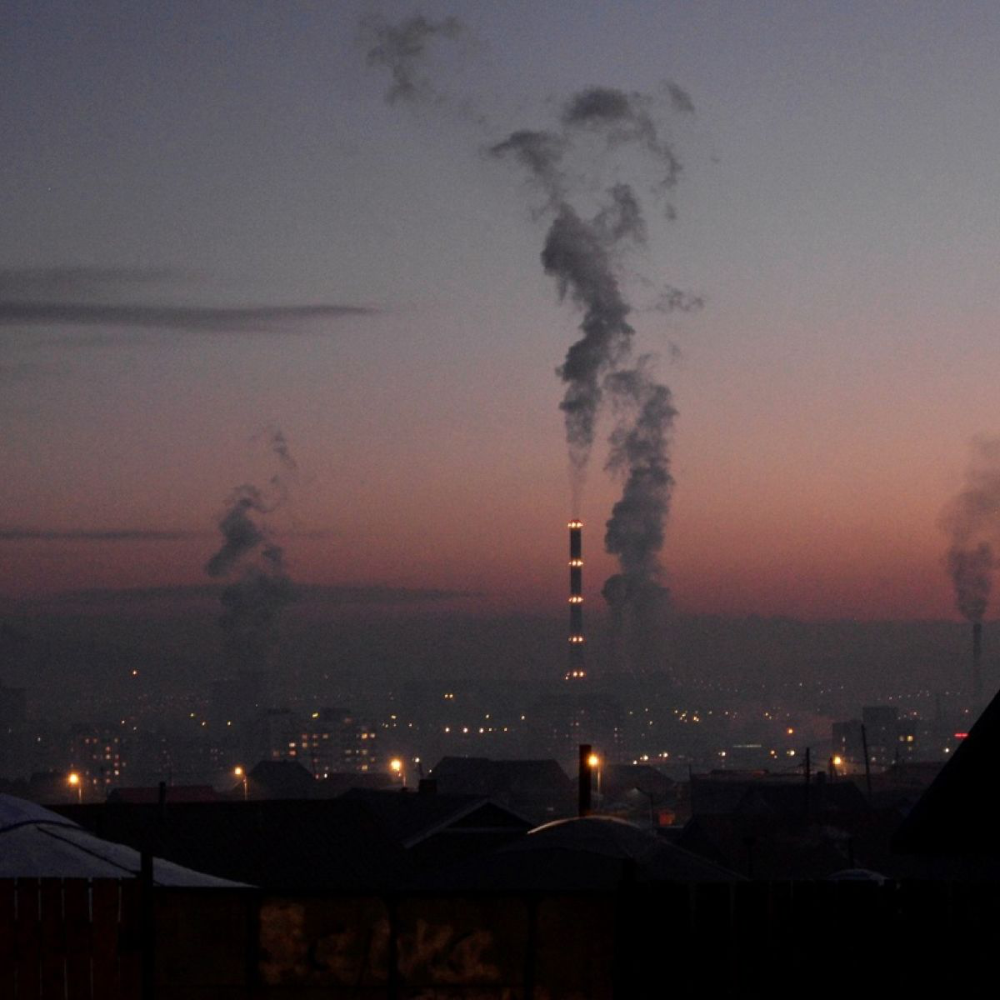

In [ ]:
#Opening second image
image = Image.open("Mug.jpg")
image

In [ ]:
prediction('Mug.jpg', model)

Predicted class is: Polluted air
With a confidence score of:  0.98702747


1

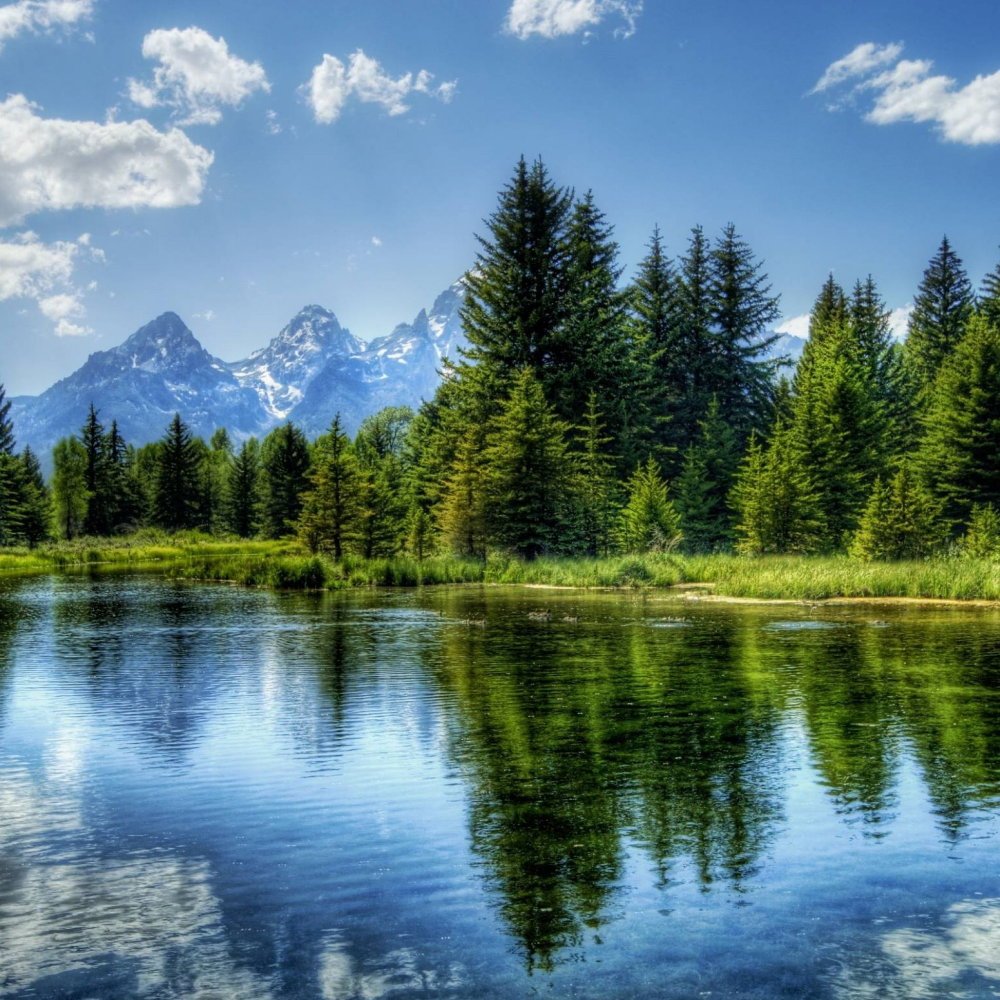

In [ ]:
#Opening third image
image = Image.open("Donut.jpg")
image

In [ ]:
prediction('Donut.jpg', model)

Predicted class is: Clean air
With a confidence score of:  0.9960205


0

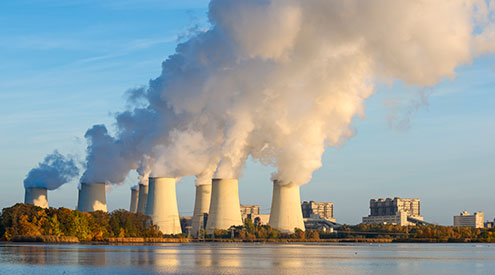

In [ ]:
#Opening test image
image = Image.open("testtest.jpg")
image

In [ ]:
prediction('testtest.jpg', model)

Predicted class is: Polluted air
With a confidence score of:  0.9867487


1

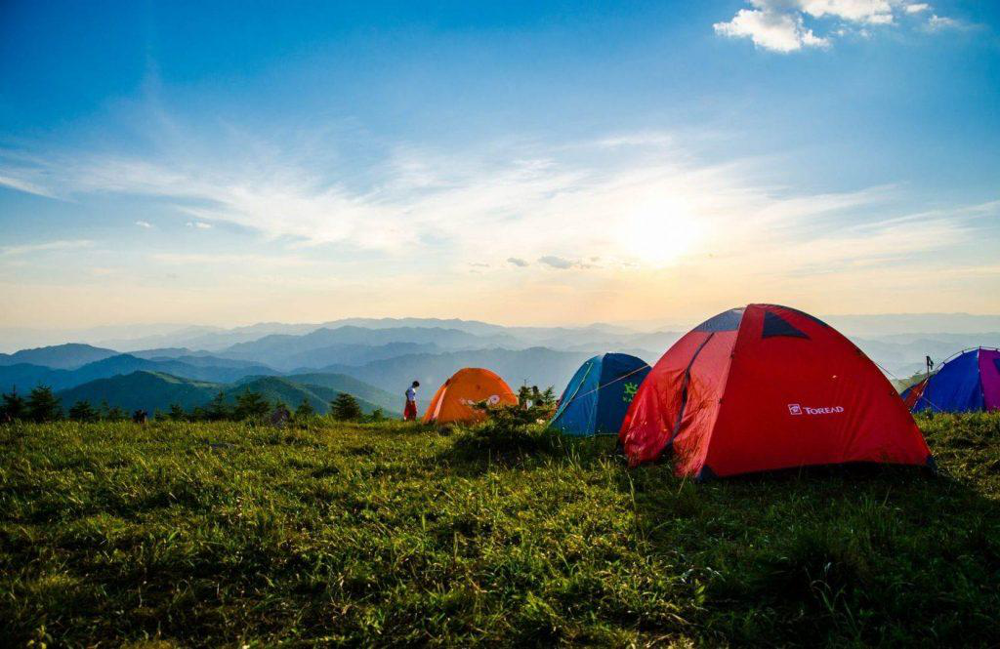

In [ ]:
#Opening camp image
image = Image.open("camping.jpg")
image

In [ ]:
prediction('camping.jpg', model)

Predicted class is: Clean air
With a confidence score of:  0.9529198


0

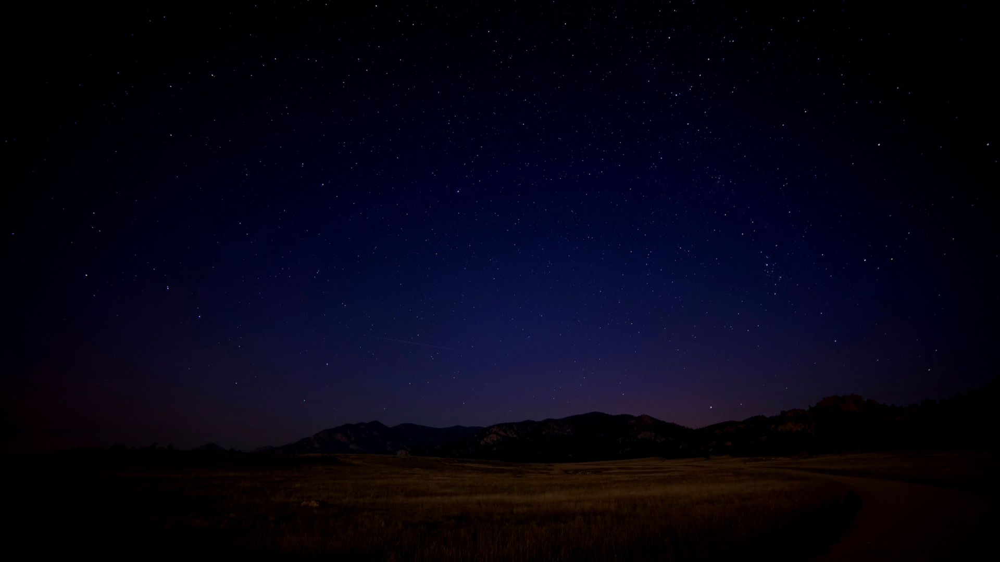

In [ ]:
image = Image.open("night.jpg")
image

In [ ]:
prediction("night.jpg",model)

Predicted class is: Clean air
With a confidence score of:  0.9861195


0